In [1]:
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.sparse import csr_matrix
import numpy as np
import pandas as pd
import seaborn as sns
import collections
import os
import pickle

In [2]:
import tcri
from genevector.data import GeneVectorDataset
from genevector.model import GeneVector
from genevector.embedding import GeneEmbedding, CellEmbedding
import grimoire as spell

## Configuration

In [10]:
#any without signed mi were  false
disease            = "scc"
subset             = "CD8"
signed_mi          = True
init_ortho         = True
entropy_threshold  = 1.
mutual_information = "/Users/ceglian/Data/tcri/{}_{}_{}_{}.p".format(disease,subset,signed_mi,str(entropy_threshold).replace(".",""))
print(mutual_information)
adata_h5ad         = "/Users/ceglian/Data/tcri/yost.h5ad"
embedding_size     = 100
alpha              = 0.0
beta               = 0.0
gain               = 10
c                  = 100
vector_file        = "/Users/ceglian/Data/tcri/{}_{}_{}_{}_{}_{}_{}_{}.vec".format(disease,embedding_size, alpha, beta, gain, subset, signed_mi, init_ortho)
print(vector_file)
retrain            = True
annotated_h5ad     = "/Users/ceglian/Data/tcri/{}_{}_annoated.h5ad".format(disease,subset)
device             = "cpu"


cd8 = ['CD8_act',
        'CD8_eff',
        'CD8_ex',
        'CD8_ex_act',
        'CD8_mem',
        'CD8_naive']
cd4 = ['Naive',
        'Tfh',
        'Th17',
        'Tregs']

/Users/ceglian/Data/tcri/scc_CD8_True_10.p
/Users/ceglian/Data/tcri/scc_100_0.0_0.0_10_CD8_True_True.vec


## Read SCC data

In [4]:
adata = sc.read(adata_h5ad)
adata.X = csr_matrix(adata.X)
adata = adata[adata.obs["disease"] == disease]
adata = spell.pp.remove_meaningless_genes(adata)

genes = [x for x in adata.var.index.tolist()]
genes = [x for x in genes if "TRAV" not in x]
genes = [x for x in genes if "TRAJ" not in x]
genes = [x for x in genes if "TRAD" not in x]


genes = [x for x in genes if "TRBV" not in x]
genes = [x for x in genes if "TRBJ" not in x]
genes = [x for x in genes if "TRBD" not in x]

genes = [x for x in genes if "TRGV" not in x]
genes = [x for x in genes if "TRGJ" not in x]
genes = [x for x in genes if "TRGD" not in x]

genes = [x for x in genes if "TRDV" not in x]
genes = [x for x in genes if "TRDJ" not in x]
genes = [x for x in genes if "TRDD" not in x]

adata = adata[:,genes]

tcri.pp.register_clonotype_key(adata,"trb")
adata = adata[adata.obs[adata.uns["tcri_clone_key"]]!="None"]
if subset == "CD8":
    adata = adata[adata.obs["cluster"].isin(cd8)]
else:
    adata = adata[adata.obs["cluster"].isin(cd4)]
tcri.pp.gene_entropy(adata)
adata = adata[:,adata.var["entropy"] > entropy_threshold]
dataset = GeneVectorDataset(adata,load_expression=True,signed_mi=signed_mi,device=device)

100%|██████████| 15828/15828 [00:03<00:00, 5271.33it/s]


Running...
Loading Expression.
Indexing expression.


100%|██████████| 7086750/7086750 [00:04<00:00, 1434855.47it/s]


Finished.


In [11]:
# if os.path.exists(vector_file):
#     retrain = False
#     print("found previous model.")
# print(len(dataset.mi_scores),len(adata.var.index))
if retrain:
    if os.path.exists(mutual_information):
        dataset.mi_scores = pickle.load(open(mutual_information,"rb"))
    cmps = GeneVector(dataset,
                        output_file=vector_file,
                        emb_dimension=embedding_size,
                        gain=gain,
                        c=c,
                        init_ortho=init_ortho,
                        device=device)
    pickle.dump(dict(dataset.mi_scores),open(mutual_information,"wb"))

hit
*****************
Loading Dataset.
*****************



100%|██████████| 1084/1084 [00:00<00:00, 3720.50it/s]


MI Loaded.
Loading Batches for Training.


100%|██████████| 1084/1084 [00:00<00:00, 1393.88it/s]


Ready to train.


**** Epoch 0 	Loss: 48186.49414
**** Epoch 100 	Loss: 11262.26826
**** Epoch 200 	Loss: 7573.23709
**** Epoch 300 	Loss: 5947.08512
**** Epoch 400 	Loss: 4998.06903
**** Epoch 500 	Loss: 4314.63851
**** Epoch 600 	Loss: 3777.68942
**** Epoch 700 	Loss: 3319.36403
**** Epoch 800 	Loss: 2910.33101
**** Epoch 900 	Loss: 2542.95805
**** Epoch 1000 	Loss: 2217.07466
**** Epoch 1100 	Loss: 1933.65911
**** Epoch 1200 	Loss: 1691.02939
**** Epoch 1300 	Loss: 1486.13062
**** Epoch 1400 	Loss: 1314.80149
**** Epoch 1500 	Loss: 1172.315
**** Epoch 1600 	Loss: 1054.89473
**** Epoch 1700 	Loss: 958.94038
**** Epoch 1800 	Loss: 881.60156
**** Epoch 1900 	Loss: 819.95487
**** Epoch 2000 	Loss: 771.2427
**** Epoch 2100 	Loss: 733.15051
**** Epoch 2200 	Loss: 703.47559
**** Epoch 2300 	Loss: 680.39028
**** Epoch 2400 	Loss: 662.33563
**** Epoch 2500 	Loss: 648.14647
**** Epoch 2600 	Loss: 636.85858
**** Epoch 2700 	Loss: 627.73939
**** Epoch 2800 	Loss: 620.25873
**** Epoch 2900 	Loss: 614.00741
**** E

100%|██████████| 1084/1084 [00:00<00:00, 516661.99it/s]


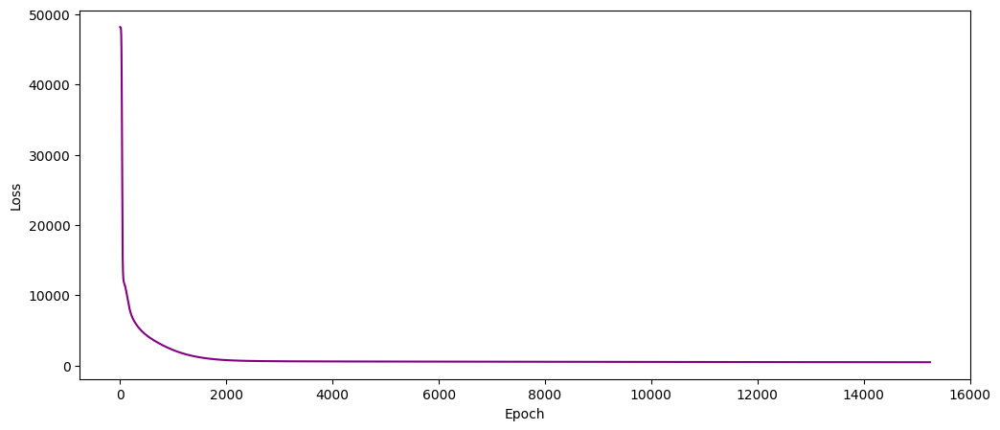

In [12]:

if retrain:
    cmps.train(100000,threshold=1e-5,alpha=alpha, beta=beta, update_interval=100)
    embed = GeneEmbedding(vector_file, dataset, vector="average")
    cmps.plot()

In [13]:
embed = GeneEmbedding(vector_file, dataset, vector="average")
cembed = CellEmbedding(dataset, embed)
adata = cembed.get_adata()
adata

Loading average of 1st and 2nd weights.


100%|██████████| 7086750/7086750 [00:14<00:00, 477391.28it/s]


Generating Cell Vectors.


100%|██████████| 12889/12889 [00:02<00:00, 5126.30it/s]


Found 0 Cells with No Counts.
Finished.
Loading embedding in X_genevector.
Running Scanpy neighbors and umap.


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


AnnData object with n_obs × n_vars = 12889 × 1084
    obs: 'cell.id', 'patient', 'treatment', 'cluster', 'UMAP1', 'UMAP2', 'trb', 'trb2', 'disease', 'response'
    var: 'entropy'
    uns: 'cluster_colors', 'tcri_clone_key', 'tcri_unique_clonotypes', 'neighbors', 'umap'
    obsm: 'X_umap', 'X_genevector'
    obsp: 'distances', 'connectivities'

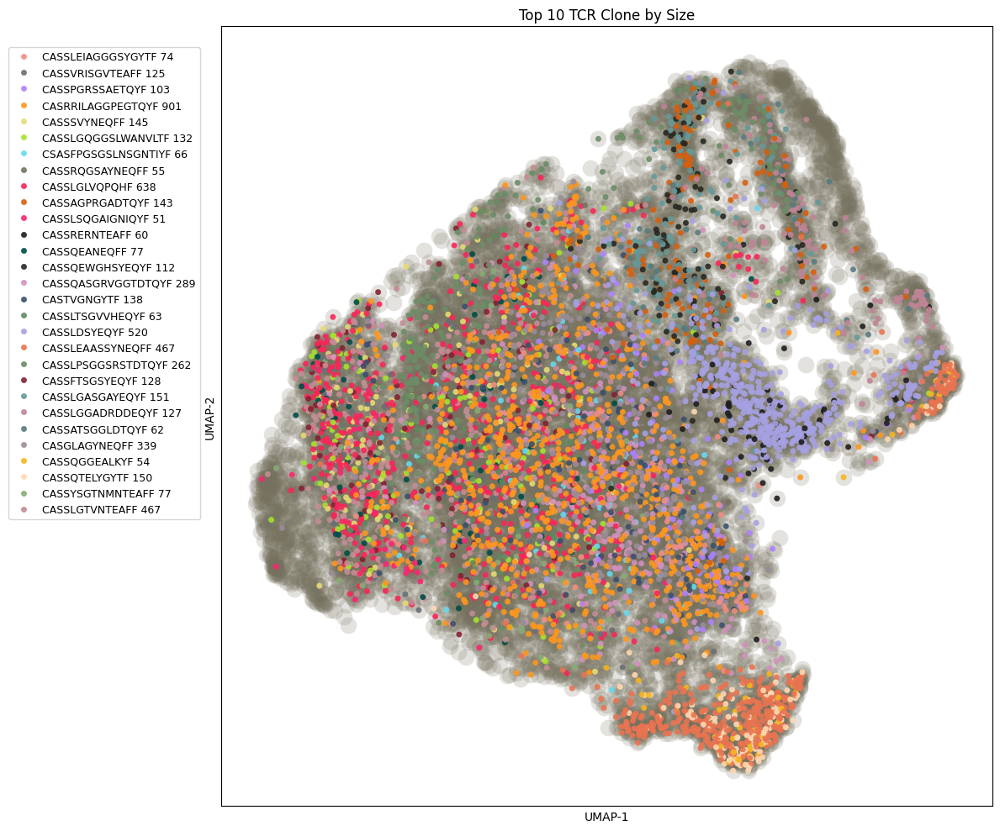

In [23]:
tcri.pl.top_clone_umap(adata,figsize=(12,10),top_n=30,bg_size=200,bg_alpha=0.2)

In [16]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [53]:
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import matplotlib.pyplot as plt
import pandas
import tqdm
import scanpy as sc
import networkx as nx
from sklearn.metrics import confusion_matrix
from scipy.special import softmax
from scipy.spatial import distance
import numpy
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from scipy.sparse import csr_matrix
import numpy as np
import operator
import collections
import os   
import pandas as pd
import gc
from scipy.stats import pearsonr
import numpy as np
import pandas as pd
import seaborn as sns

markers = dict()
markers["Naive/CM"] = ["SELL"]
markers["Activated"] = ["GZMB"]
markers["Memory"] = ["GZMK"]
markers["Dsyfunctional"] = ["CXCL13"]

def cell_distance(self, vec, norm=True):
    # matrix = self.matrix
    # if norm:
    #     vec /= np.linalg.norm(vec)
    #     print("norm")
    #     matrix = normalize(matrix)
    mapped_components = dict(zip(list(self.data.keys()),self.matrix))
    odists = []
    for x in tqdm.tqdm(self.adata.obs.index):
        cell_vec = mapped_components[x]
        # if norm:
        #     cell_vec /= np.linalg.norm(cell_vec)
        dist = 1. - distance.cosine(cell_vec, vec)
        odists.append(dist)
    return odists

class bcolors:
    HEADER = '\033[95m'
    OKBLUE = '\033[94m'
    OKCYAN = '\033[96m'
    OKGREEN = '\033[92m'
    WARNING = '\033[93m'
    FAIL = '\033[91m'
    ENDC = '\033[0m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'

from sklearn import preprocessing

def phenotype_probability(self, adata, phenotype_markers, return_distances=False, method="sparsemax", target_col="genevector", temperature=0.05, normalize=True):
    """
    Probablistically assign phenotypes based on a set of cell type labels and associated markers. 
    Can optionally return the original cosine distances and perform the assignment based on expression weight gene vectors.
    Loads into the anndata the pseudo-probabilities for each cell type and the deterministic label taken from the maximum probability over cell types.

    :param adata: anndata object generated from "get_adata", has "X_genevector" in the obsm dataframe.
    :type column: anndata.AnnData
    :param phenotype_markers: Dictionary of cell type labels (key) to gene markers used to define the cell type as a list (value).
    :type phenotype_markers: dict
    :param return_distances: Change the return type to a tuple that includes a dictionary containing the actual cosine distances alongside the phenotype probabilities.
    :type column: bool
    :param expression_weighted: Compute similarit to each cell using the expression weightedy marker gnene vector.
    :type column: bool
    :param target_col: Column label to load in deterministic cell asssignments in the obs data frame of the anndata object.
    :type target_col: bool
    :return: Anndata with cell type labels and probabilities, or optionally a tuple with the anndata and the raw cosine similarities.
    :rtype:  anndata.AnnData
    """
    if method == "softmax":
        print(bcolors.OKBLUE+"Using **SoftMax**"+bcolors.ENDC)
        pfunc = softmax
    elif method == "sparsemax":
        print(bcolors.OKBLUE+"Using **SparseMax**"+bcolors.ENDC)
        pfunc = self.entmax_15
    elif method == "normalized_exponential":
        print(bcolors.OKBLUE+"Using Normalized Exponential (Temp: {})".format(temperature)+bcolors.ENDC)
        pfunc = lambda x: self.normalized_exponential_vector(x, temperature)
    for x in adata.obs.columns:
        if "Pseudo-probability" in x:
            del adata.obs[x]
    mapped_components = dict(zip(list(self.data.keys()),self.matrix))
    genes = adata.var.index.to_list()
    cells = adata.obs.index.to_list()
    all_markers = []
    for _, markers in phenotype_markers.items():
        all_markers += markers  
    all_markers = list(set(all_markers))
    probs = dict()

    for pheno, markers in phenotype_markers.items():
        print(bcolors.OKBLUE+"Computing similarities for {}".format(pheno)+bcolors.ENDC)
        print(bcolors.OKGREEN+"Markers: {}".format(", ".join(markers))+bcolors.ENDC)
        vector = self.embed.generate_vector(markers)
        probs[pheno] = cell_distance(self, vector,norm=normalize)
    distribution = []
    celltypes = []
    for k, v in probs.items():
        distribution.append(v)
        celltypes.append(k)
    distribution = np.array(distribution)
    distribution = preprocessing.normalize(distribution)
    distribution = list(zip(*distribution))
    probabilities = []
    for d in distribution:
        p = pfunc(numpy.array(d))
        probabilities.append(p)
    
    res = {"distances":distribution, "order":celltypes, "probabilities":probabilities}
    barcode_to_label = dict(zip(list(self.data.keys()), res["probabilities"]))
    ct = []
    probs = collections.defaultdict(list)
    for x in adata.obs.index:
        ctx = res["order"][numpy.argmax(barcode_to_label[x])]
        ct.append(ctx)
        for ph, pb in zip(res["order"],barcode_to_label[x]):
            probs[ph].append(pb)
    adata.obs[target_col] = ct
    def load_predictions(adata,probs):
        prob_cols = []
        for ph in probs.keys():
            prob_cols.append(ph+" Pseudo-probability")
            adata.obs[ph+" Pseudo-probability"] = probs[ph]
        adata.uns["probability_columns"] = prob_cols
        return adata
    adata = load_predictions(adata, probs)
    if return_distances:
        return adata, res
    else:
        return adata

adata, dist = phenotype_probability(cembed, adata, markers, method="normalized_exponential", temperature=0.0001, return_distances=True, normalize=True)

Using Normalized Exponential (Temp: 0.0001)
Computing similarities for Naive/CM
Markers: SELL


100%|██████████| 12889/12889 [00:00<00:00, 48742.22it/s]


Computing similarities for Activated
Markers: GZMB


100%|██████████| 12889/12889 [00:00<00:00, 62932.70it/s]


Computing similarities for Memory
Markers: GZMK


100%|██████████| 12889/12889 [00:00<00:00, 65926.98it/s]


Computing similarities for Dsyfunctional
Markers: CXCL13


100%|██████████| 12889/12889 [00:00<00:00, 63683.99it/s]


<Axes: xlabel='genevector', ylabel='count'>

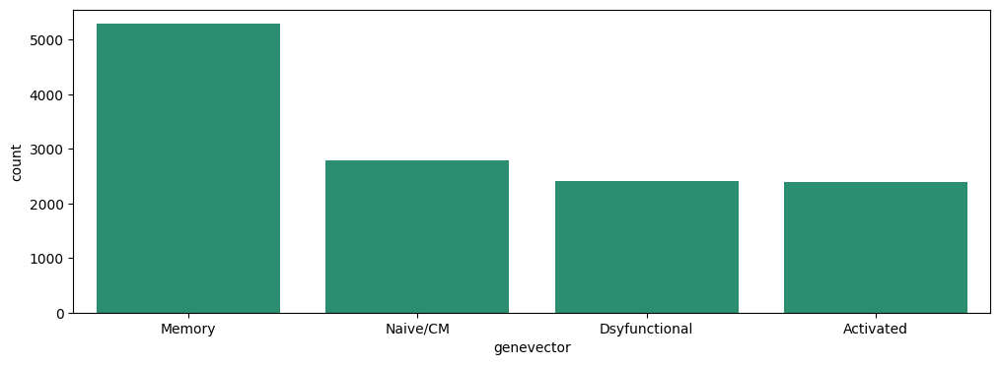

In [54]:
fig,ax=plt.subplots(1,1,figsize=(12,4))
sns.countplot(data=adata.obs, x="genevector",ax=ax)

<Axes: xlabel='cluster', ylabel='count'>

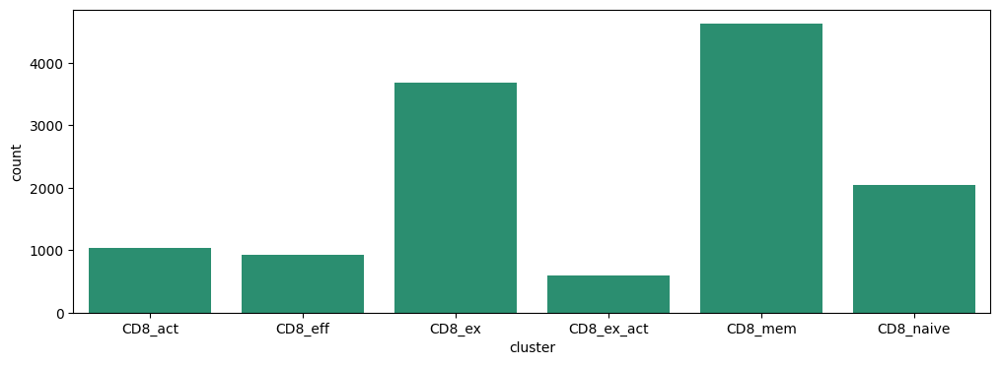

In [55]:
fig,ax=plt.subplots(1,1,figsize=(12,4))
sns.countplot(data=adata.obs, x="cluster",ax=ax)

<Axes: xlabel='genevector', ylabel='cluster'>

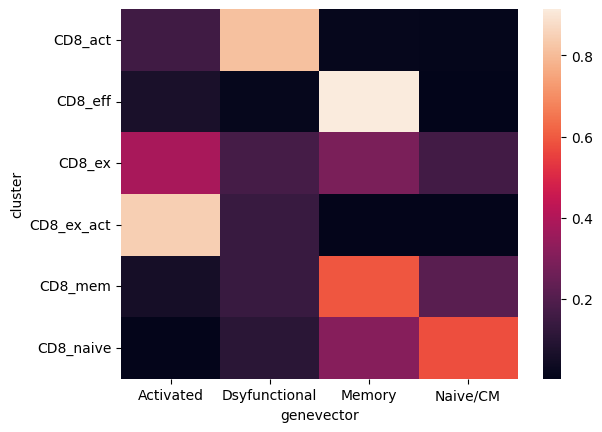

In [56]:

cembed.compare_classification(adata,"cluster","genevector")

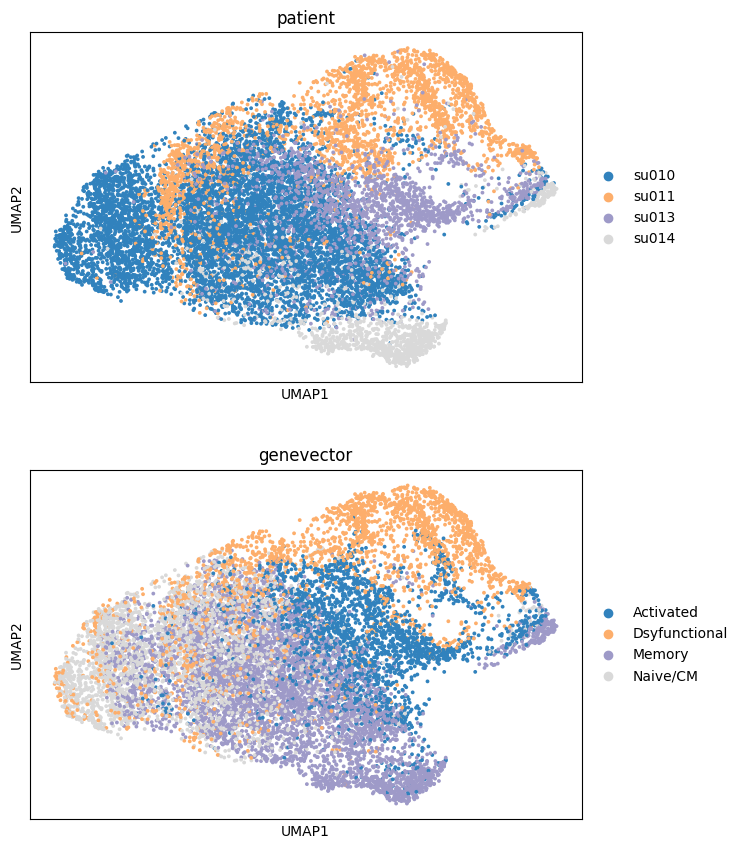

In [57]:
sc.pl.umap(adata,color=["patient","genevector"],s=30,wspace=0.2, ncols=1,palette="tab20c")

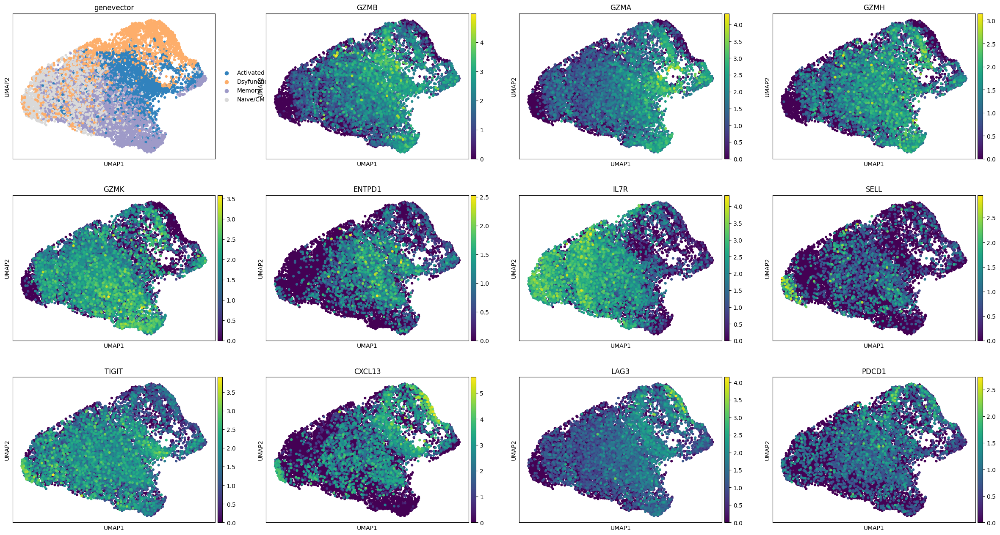

In [58]:
sc.pl.umap(adata,color=["genevector","GZMB","GZMA","GZMH","GZMK",
                        "ENTPD1","IL7R","SELL","TIGIT","CXCL13",
                        "LAG3","PDCD1"],s=80)

<Axes: xlabel='genevector', ylabel='count'>

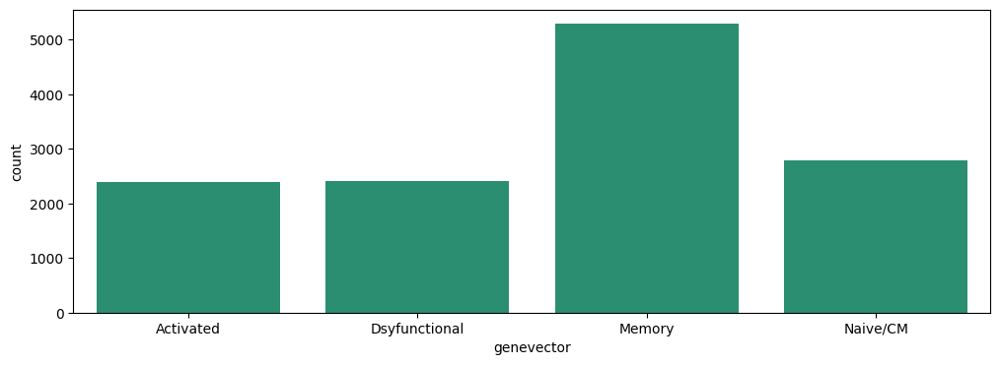

In [59]:
fig,ax=plt.subplots(1,1,figsize=(12,4))
sns.countplot(data=adata.obs, x="genevector",ax=ax)


100%|██████████| 12889/12889 [00:00<00:00, 59591.82it/s]


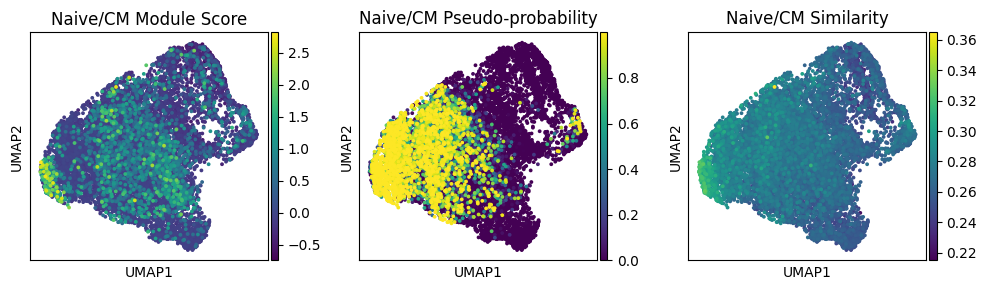

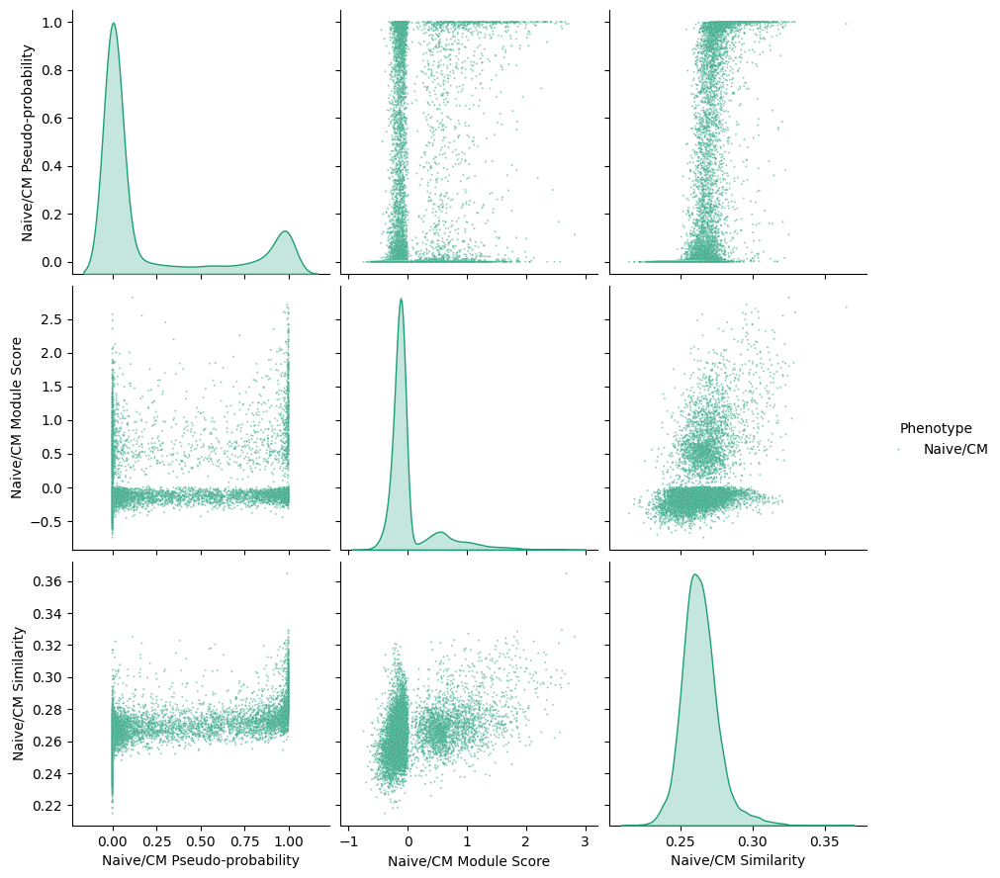

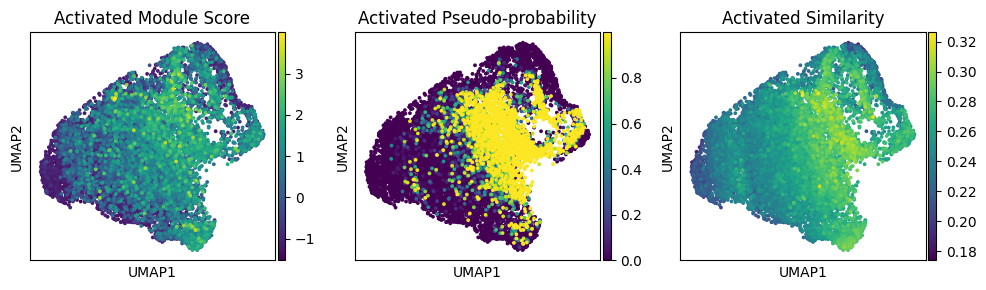

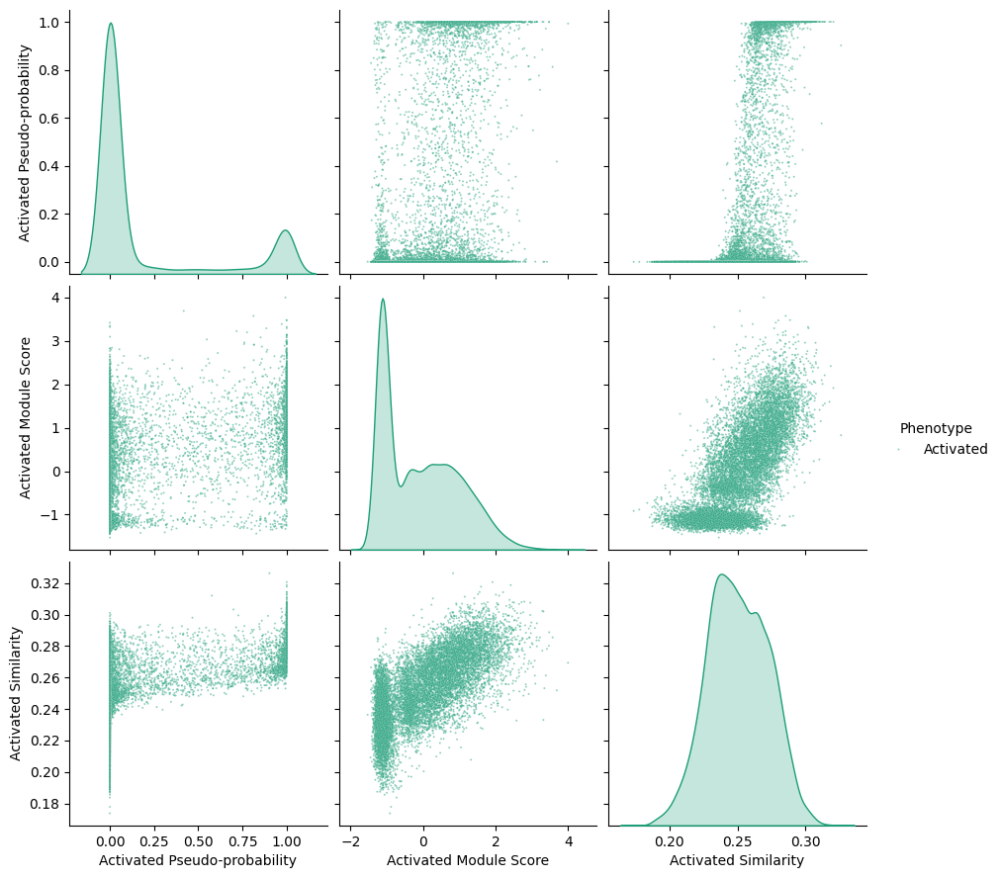

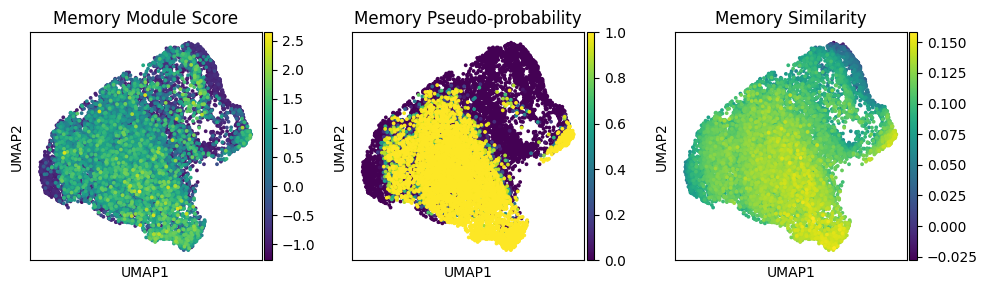

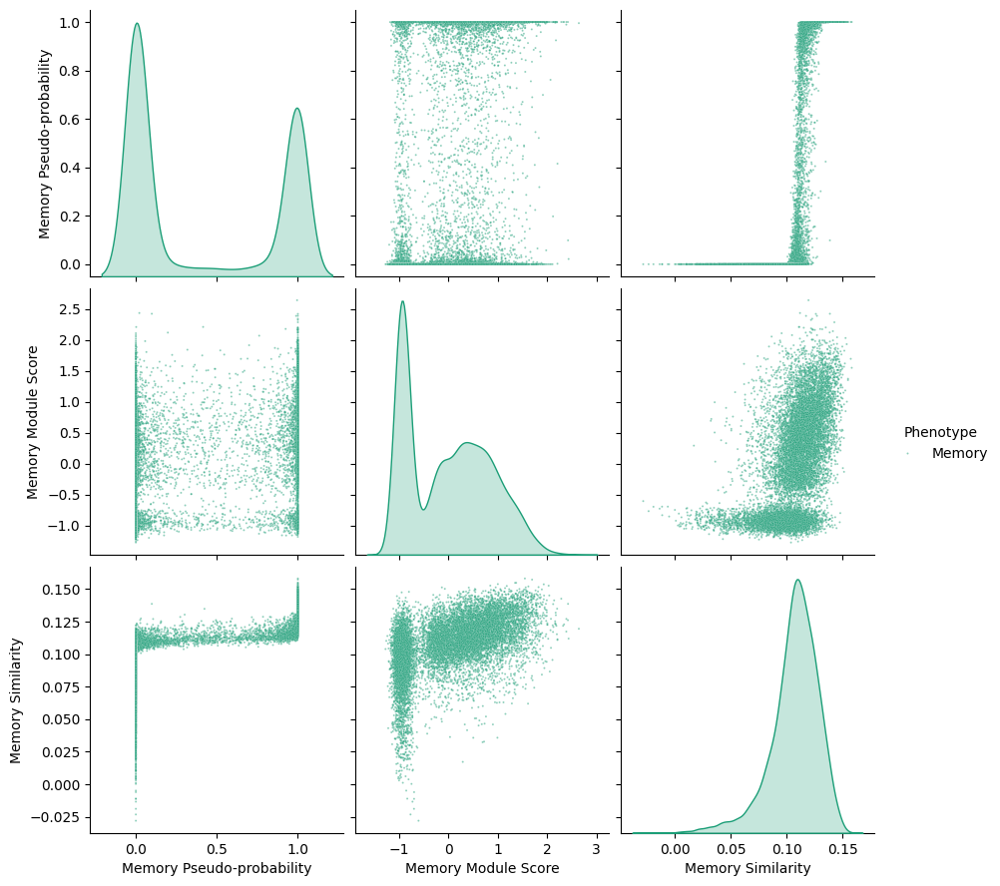

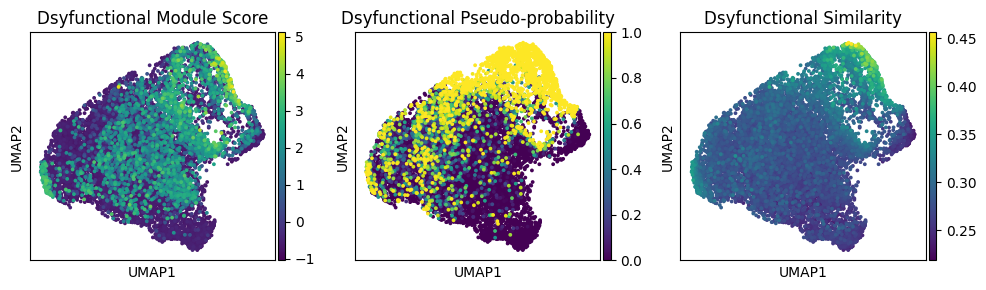

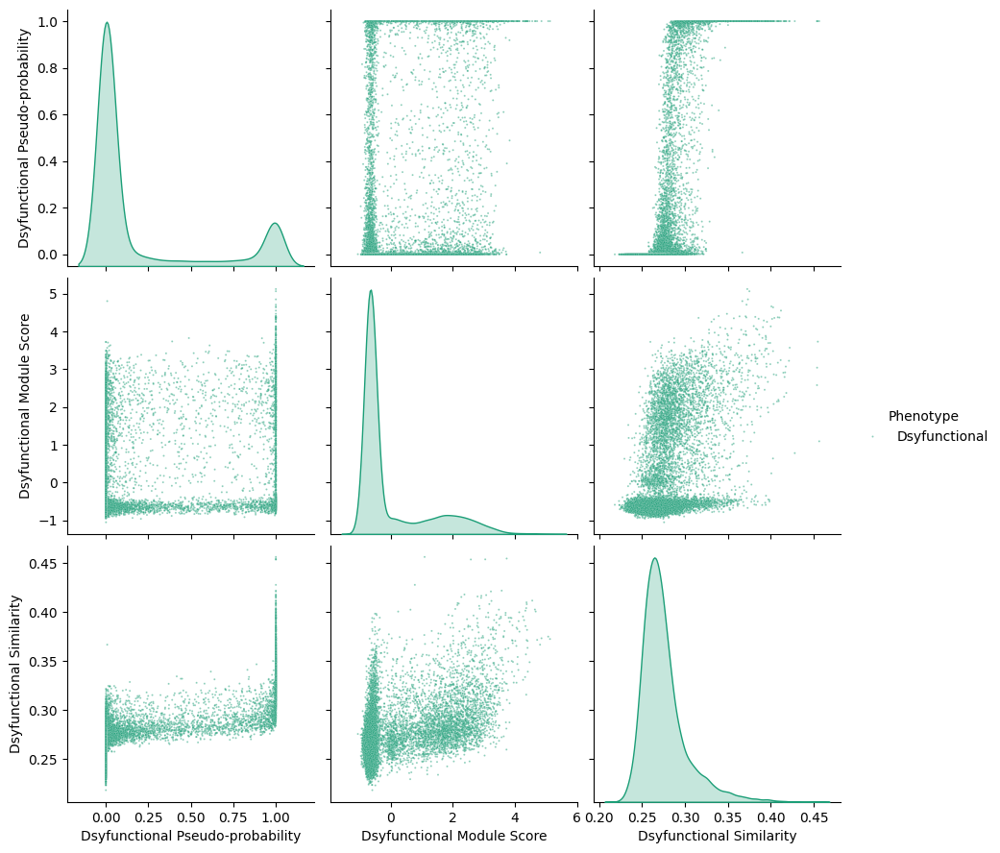

In [60]:
for phenotype, genes  in markers.items():
    cembed.phenotype_qc(adata,phenotype,genes)

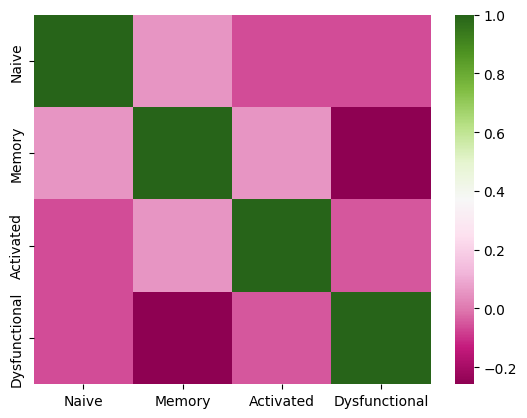

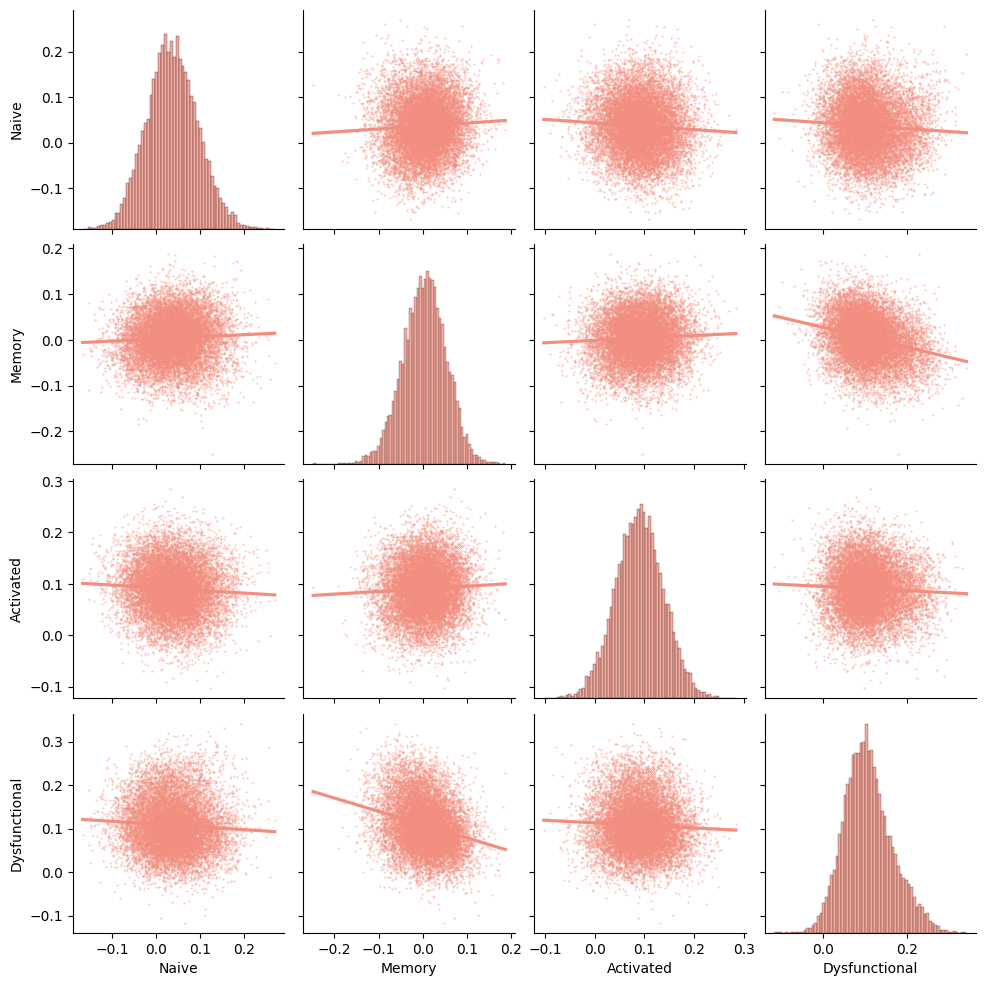

In [186]:
ddf = pd.DataFrame(data = np.array(dist["distances"]),columns=dist['order'])
mat = pd.DataFrame(np.corrcoef(ddf.to_numpy().T),index=dist["order"],columns=dist["order"])
sns.heatmap(mat,cmap="PiYG")
sns.pairplot(data=ddf,kind="reg",plot_kws={"scatter_kws":{"s":0.1}})

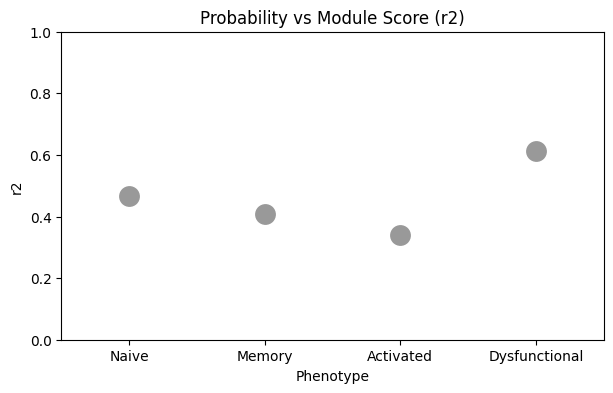

In [187]:
cembed.module_score_r2(adata,markers)

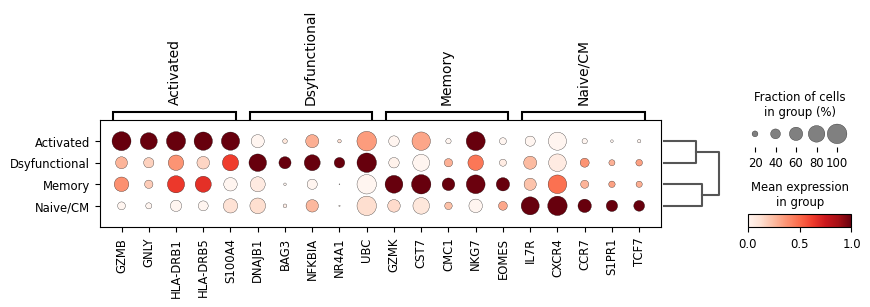

In [61]:
sc.tl.rank_genes_groups(adata,"genevector")
sc.tl.dendrogram(adata,"genevector")
sc.pl.rank_genes_groups_dotplot(adata,min_logfoldchange=1.,standard_scale='var',n_genes=5)

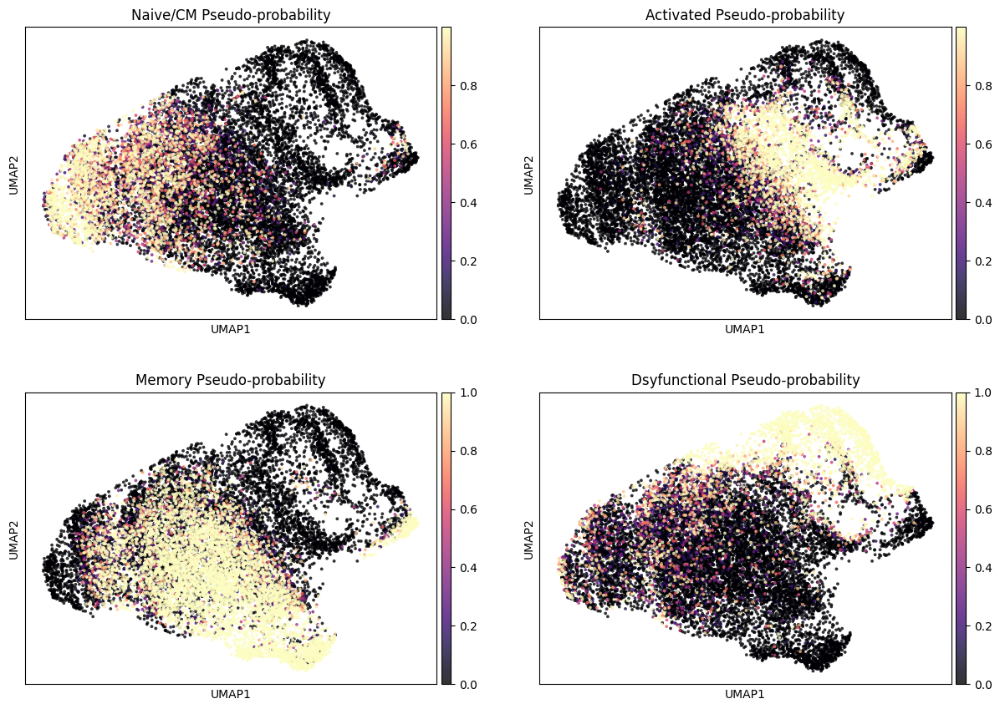

In [62]:

cembed.plot_probabilities(adata)

In [63]:
tcri.pp.register_phenotype_key(adata,"genevector")
tcri.pp.register_clonotype_key(adata,"trb")

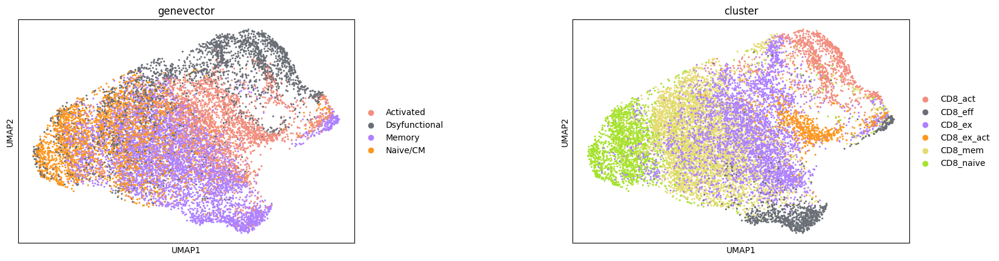

In [64]:
sc.pl.umap(adata,color=["genevector","cluster"],palette=tcri.pl.tcri_colors,s=20, wspace=0.5)

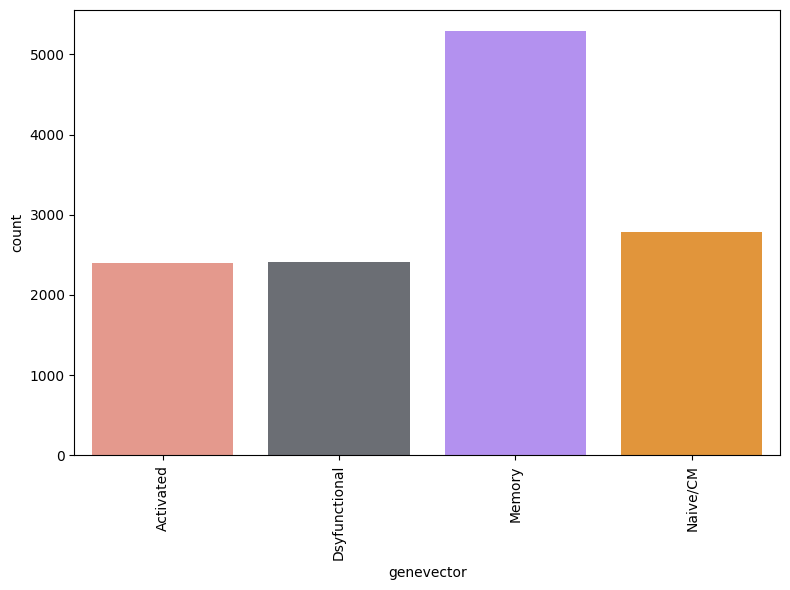

In [65]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
sns.countplot(data=adata.obs,x="genevector",palette=tcri.pl.tcri_colors,ax=ax)
plt.xticks(rotation=90)
fig.tight_layout()

In [67]:
tcri.pp.clone_size(adata)

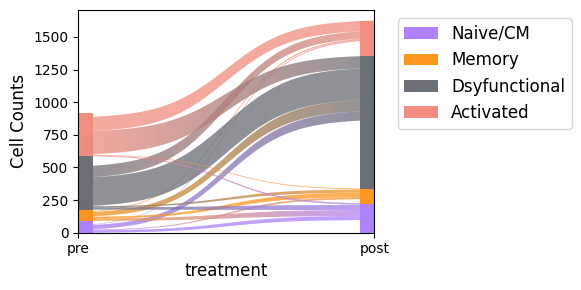

In [68]:
responder = adata[adata.obs["response"] == "Yes (CR)"]
responder = responder[responder.obs["clone_size"] > 1]
tcri.pl.phenotypic_flux(responder,splitby="treatment",order=["pre","post"], nt=False,normalize=False)

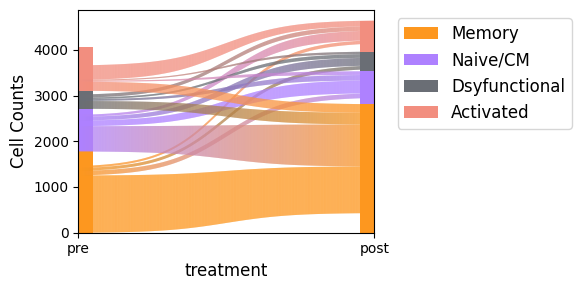

In [69]:
responder = adata[adata.obs["response"] == "No"]
responder = responder[responder.obs["clone_size"] > 1]
tcri.pl.phenotypic_flux(responder,splitby="treatment",order=["pre","post"],nt=False, normalize=False)

View of AnnData object with n_obs × n_vars = 2541 × 1084
    obs: 'cell.id', 'patient', 'treatment', 'cluster', 'UMAP1', 'UMAP2', 'trb', 'trb2', 'disease', 'response', 'genevector', 'Naive/CM Module Score', 'Activated Module Score', 'Memory Module Score', 'Dsyfunctional Module Score', 'clone_size', 'Naive/CM Pseudo-probability', 'Activated Pseudo-probability', 'Memory Pseudo-probability', 'Dsyfunctional Pseudo-probability', 'Naive/CM Similarity', 'Activated Similarity', 'Memory Similarity', 'Dsyfunctional Similarity'
    var: 'entropy'
    uns: 'cluster_colors', 'tcri_clone_key', 'tcri_unique_clonotypes', 'neighbors', 'umap', 'log1p', 'probability_columns', 'patient_colors', 'genevector_colors', 'rank_genes_groups', 'dendrogram_genevector', 'tcri_unique_phenotypes', 'tcri_phenotype_key'
    obsm: 'X_umap', 'X_genevector', 'X_pca'
    obsp: 'distances', 'connectivities'


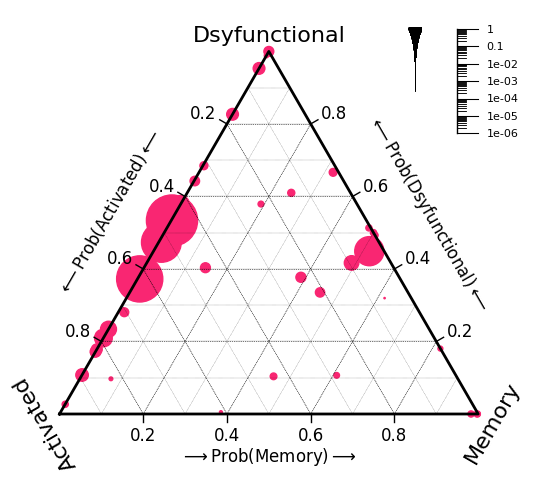

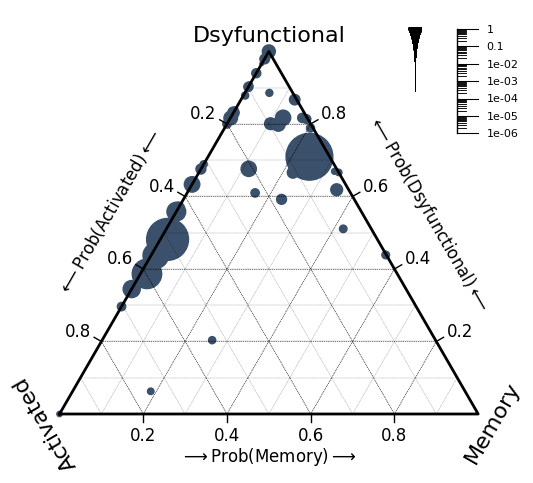

In [70]:
def freq_to_size_scaling(freq):
    return 80*(freq**(1/2))

# ddata = adata[adata.obs['disease'] == "bcc"]
responder = adata[adata.obs["response"] == "Yes (CR)"]
print(responder)
responder = responder[responder.obs["treatment"] == "pre"]
responder = responder[responder.obs["clone_size"] > 5]
tcri.pp.joint_distribution(responder)

tcri.pl.probability_ternary(responder,["Dsyfunctional","Activated","Memory"],splitby="treatment",conditions=["pre"],scale_function=lambda x: freq_to_size_scaling(x),color=tcri.pl.tcri_colors[10])
plt.savefig("/Users/ceglian/resp_bcc_tern.pdf")

responder = adata[adata.obs["response"] == "Yes (CR)"]
responder = responder[responder.obs["treatment"] == "post"]
responder = responder[responder.obs["clone_size"] > 5]
tcri.pp.joint_distribution(responder)

tcri.pl.probability_ternary(responder,["Dsyfunctional","Activated","Memory"],splitby="treatment",conditions=["post"],scale_function=lambda x: freq_to_size_scaling(x),color=tcri.pl.tcri_colors[15])
plt.savefig("/Users/ceglian/resp_bcc_tern.pdf")

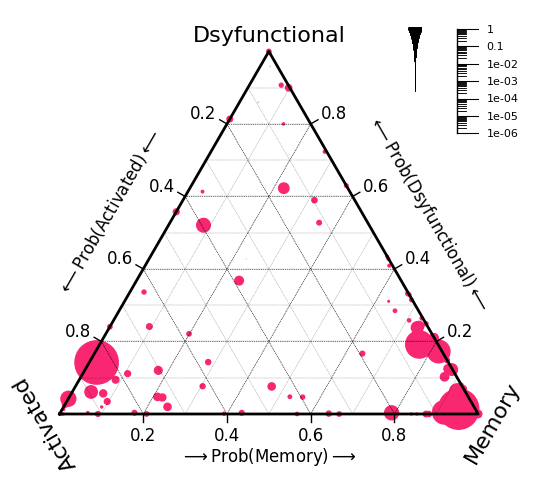

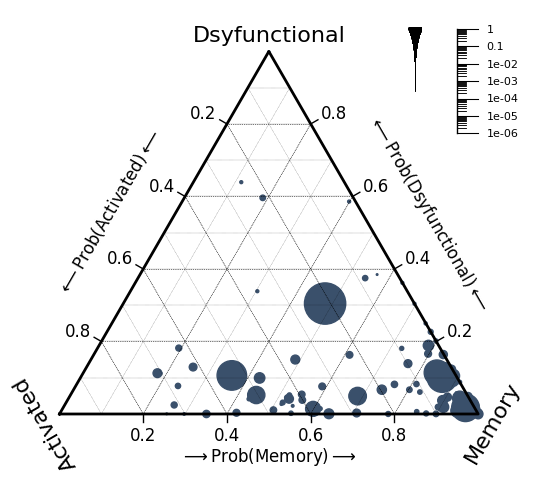

In [72]:
def freq_to_size_scaling(freq):
    return 80*(freq**(1/2))

# ddata = adata[adata.obs['disease'] == "bcc"]
responder = adata[adata.obs["response"] == "No"]
responder = responder[responder.obs["treatment"] == "pre"]
responder = responder[responder.obs["clone_size"] > 5]
tcri.pp.joint_distribution(responder)

tcri.pl.probability_ternary(responder,["Dsyfunctional","Activated","Memory"],splitby="treatment",conditions=["pre"],scale_function=lambda x: freq_to_size_scaling(x),color=tcri.pl.tcri_colors[10])
plt.savefig("/Users/ceglian/resp_bcc_tern.pdf")

responder = adata[adata.obs["response"] == "No"]
responder = responder[responder.obs["treatment"] == "post"]
responder = responder[responder.obs["clone_size"] > 5]
tcri.pp.joint_distribution(responder)

tcri.pl.probability_ternary(responder,["Dsyfunctional","Activated","Memory"],splitby="treatment",conditions=["post"],scale_function=lambda x: freq_to_size_scaling(x),color=tcri.pl.tcri_colors[15])
plt.savefig("/Users/ceglian/resp_bcc_tern.pdf")

<Axes: title={'center': 'Clonality'}, xlabel='Phenotype', ylabel='Clonality'>

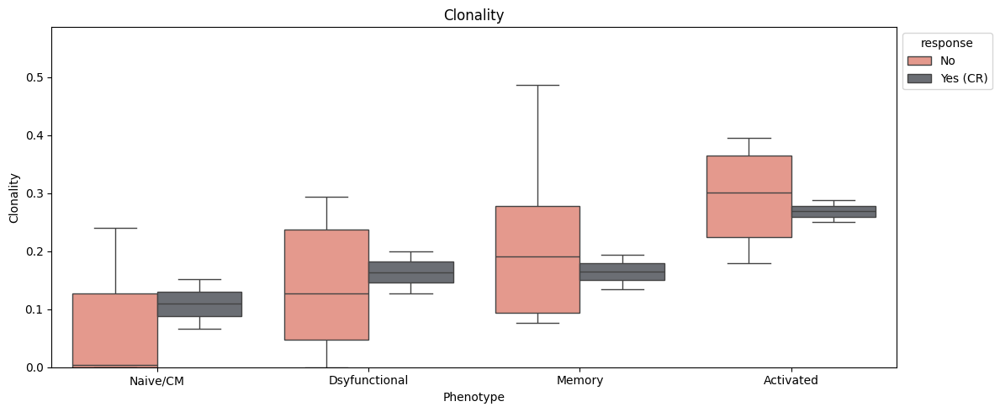

In [79]:
tcri.pl.clonality(adata, groupby="patient_treatment",splitby="response")

In [77]:
sample = []
for x,y in zip(adata.obs["patient"],adata.obs["treatment"]):
    sample.append("{}_{}".format(x,y))
adata.obs["patient_treatment"] = sample

<Axes: title={'center': 'Clonotypic Entropy'}, xlabel='Phenotype', ylabel='Clonotypic Entropy'>

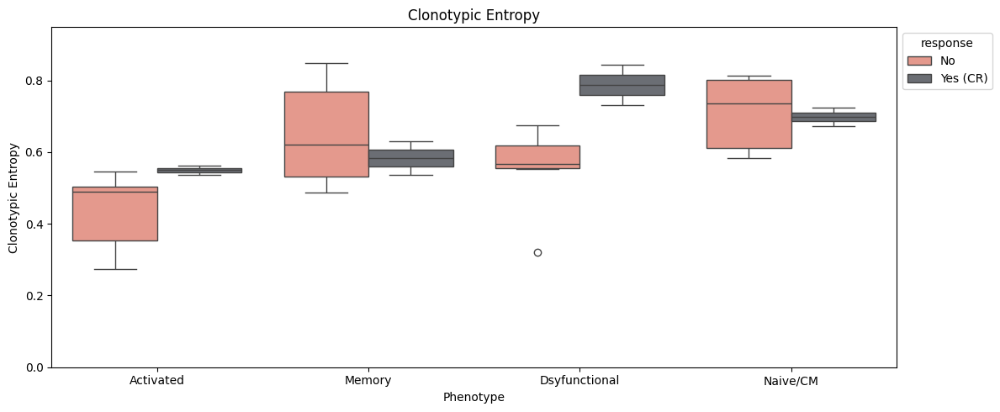

In [78]:
tcri.pl.clonotypic_entropy(adata, groupby="patient_treatment",splitby="response")

Activated        2.40493
Dsyfunctional    2.40865
Memory           0.54314
Naive/CM         0.40184
dtype: float64
Activated        2.25869
Dsyfunctional    1.40037
Memory           1.42005
Naive/CM         1.52330
dtype: float64


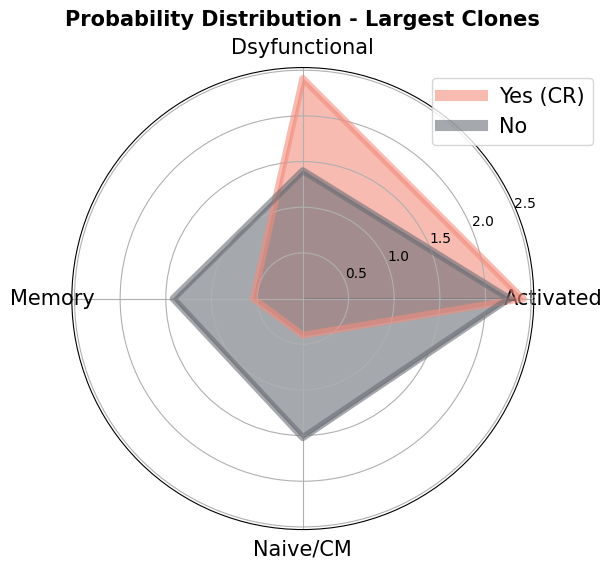

In [88]:
def polar_plot(adata, phenotypes=None, statistic="entropy", method="probabilistic", save=None, figsize=(6,6), title=None, alpha=0.6, fontsize=15, splitby=None, bbox_to_anchor=(1.15,1.), linewidth=5., legend_fontsize=15, color_dict=None):
    tcri.pp.joint_distribution(adata,method=method )
    plt.figure(figsize=figsize)
    ax = plt.subplot(111, projection='polar')
    if splitby is None:
        splits = ['All']
    else:
        splits = list(set(adata.obs[splitby]))
    if phenotypes is None:
        phenotypes = adata.uns["joint_distribution"].index
    N = len(phenotypes)
    theta = np.linspace(0.0, 2 * np.pi, N, endpoint=False)
    plot_theta = np.append(theta, theta[0])
    adata = adata[adata.obs[adata.uns["tcri_phenotype_key"]].isin(phenotypes)]
    for i, split in enumerate(splits): 
        if color_dict == None:
            colorx = tcri.pl.tcri_colors[i]
        else:
            colorx = color_dict[split]
        psubset = adata[adata.obs[splitby] == split]
        pdists = []
        for p in set(psubset.obs["patient"]):
            ppsubset = psubset[psubset.obs["patient"] == p]
            if len(ppsubset.obs.index) < 10: continue
            tcri.pp.joint_distribution(ppsubset)
            if statistic == "entropy":
                pdist = pd.Series(tcri.tl.clonotypic_entropies(ppsubset,normalized=False))
                phenotypes = pdist.index.tolist()
                pdists.append(pdist)
            else:    
                pdist = pdistribution(psubset, method=method)
            pdists.append(pdist)
        pdist = pd.DataFrame(pdists).T
        pdist = pdist.median(axis=1)
        print(pdist)
        pdist = pdist.tolist()
        pdist.append(pdist[0])
        ax.plot(plot_theta, pdist, color=colorx, alpha=alpha, label=split, linewidth=linewidth)
        ax.fill_between(plot_theta, 0, pdist, color=colorx, alpha=alpha)
    ax.set_xticks(theta)
    ax.set_xticklabels(phenotypes, fontsize=fontsize)
    ax.grid(True)
    leg = ax.legend(loc='upper right', bbox_to_anchor=bbox_to_anchor, fontsize=legend_fontsize)
    for line in leg.get_lines():
        line.set_linewidth(8.0)  # Set the line width
    if title:
        plt.title(title, va='bottom', fontsize=fontsize, fontweight="bold")
    if save:
        plt.savefig(save)
    
sub = adata[adata.obs["clone_size"] > 30]

polar_plot(sub,splitby="response",statistic="entropy", title="Probability Distribution - Largest Clones",save="/Users/ceglian/Data/tcri/pdist_polar.pdf")

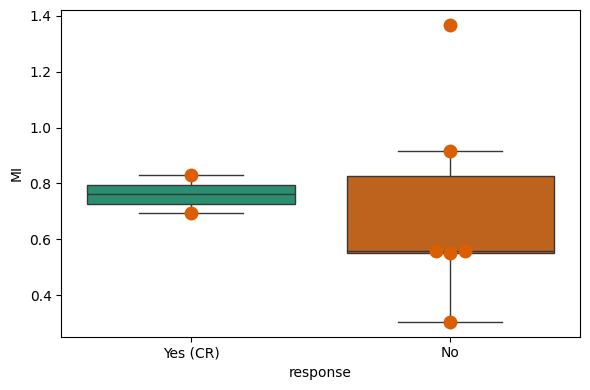

In [83]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statannot import add_stat_annotation
import matplotlib.patches as mpatches

from gseapy import dotplot
import tqdm

import collections
import operator
import itertools

def mutual_information(adata, groupby, splitby=None, method="probabilistic", figsize=(6,5)):
    mis = []
    groups = []
    splits = []
    for group in set(adata.obs[groupby]):
        gdata = adata[adata.obs[groupby] == group]
        if splitby != None:
            for split in set(gdata.obs[splitby]):
                sdata = gdata[gdata.obs[splitby] == split]
                tcri.pp.joint_distribution(sdata)
                mi = tcri.tl.mutual_information(sdata, method=method)
                mis.append(mi)
                groups.append(group)
                splits.append(split)
        else:
            tcri.pp.joint_distribution(gdata, )
            mi = tcri.tl.mutual_information(gdata,method=method)
            mis.append(mi)
            groups.append(group)
    df = pd.DataFrame.from_dict({"MI":mis, groupby: groups})
    if splitby != None:
        df[splitby] = splits
    order = list(set(adata.obs[splitby]))
    fig, ax = plt.subplots(1,1,figsize=figsize)

    sns.boxplot(data=df,x=splitby,y="MI",ax=ax,order=order,palette="Dark2")
    sns.swarmplot(data=df,x=splitby,y="MI",order=order,s=10)
    pairs = list(itertools.combinations(list(set(order)),2))
    # ax, test_results = add_stat_annotation(ax, 
    #                                         data=df,
    #                                         x=splitby,
    #                                         y="MI", 
    #                                         order=order,
    #                                         box_pairs=pairs, 
    #                                         test='Mann-Whitney', 
    #                                         text_format='star', 
    #                                         loc='outside', 
    #                                         verbose=2)
    fig.tight_layout()
    return ax

mutual_information(adata, groupby="patient_treatment",splitby="response",figsize=(6,4))
plt.savefig("/Users/ceglian/mutual_info.pdf")

In [84]:
groupby = "patient"

def phenotypic_entropies(adata, method="probabilistic", normalized=True):
    tcri.pp.joint_distribution(adata, method=method)
    tcr_sequences = adata.obs[adata.uns["tcri_clone_key"]].tolist()
    unique_tcrs = np.unique(tcr_sequences)
    jd = adata.uns["joint_distribution"].to_numpy() 
    jd = jd / np.sum(jd)
    clonotype_entropies = np.zeros(jd.shape[1])
    max_entropy = np.log(jd.shape[0])
    for i, clonotype_distribution in enumerate(jd.T):
        normalized_distribution = clonotype_distribution / np.sum(clonotype_distribution)
        epsilon = np.finfo(float).eps
        if normalized:
            clonotype_entropies[i] = -np.sum(normalized_distribution * np.log(normalized_distribution + epsilon)) / max_entropy
        else:
            clonotype_entropies[i] = -np.sum(normalized_distribution * np.log(normalized_distribution + epsilon))
    tcr_to_entropy_dict = dict(zip(unique_tcrs, clonotype_entropies))
    return tcr_to_entropy_dict


ps = []
rs = []
r2 = []
for r in set(adata.obs["response"]):
    rdata = adata[adata.obs["response"] == r]
    for p in set(rdata.obs[groupby]):
        clone = []
        size = []
        ent = []
        pdata = rdata[rdata.obs[groupby] == p]
        ents = phenotypic_entropies(pdata)
        tcri.pp.clone_size(pdata)
        sizes = dict(zip(pdata.obs[pdata.uns["tcri_clone_key"]],pdata.obs["clone_size"]))
        for tcr,entropy in ents.items():
            ent.append(entropy)
            size.append(sizes[tcr])
            clone.append(tcr)
        df = pd.DataFrame.from_dict({"Entropy":ent,"Size":size,"TCR":clone})
        c = df["Entropy"].corr(df["Size"])
        ps.append(p)
        rs.append(r)
        r2.append(c)
df = pd.DataFrame.from_dict({"Patient":ps,"Response":rs,"Coefficient":r2})
df

,Patient,Response,Coefficient
0,su011,Yes (CR),0.218377
1,su014,No,0.091164
2,su013,No,0.059965
3,su010,No,0.195445


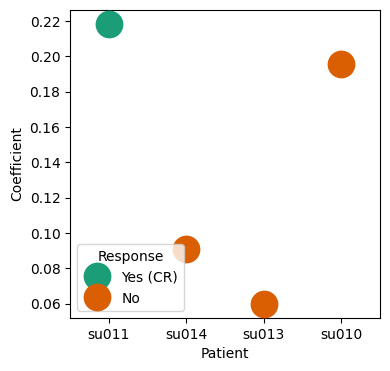

In [85]:
fig, ax = plt.subplots(1,1,figsize=(4,4))
sns.stripplot(data=df, x="Patient",y="Coefficient",s=20, hue="Response",ax=ax)
fig.savefig("/Users/ceglian/phenotypic_entropy.pdf")

<Axes: title={'center': 'Clonality'}, xlabel='Phenotype', ylabel='Clonality'>

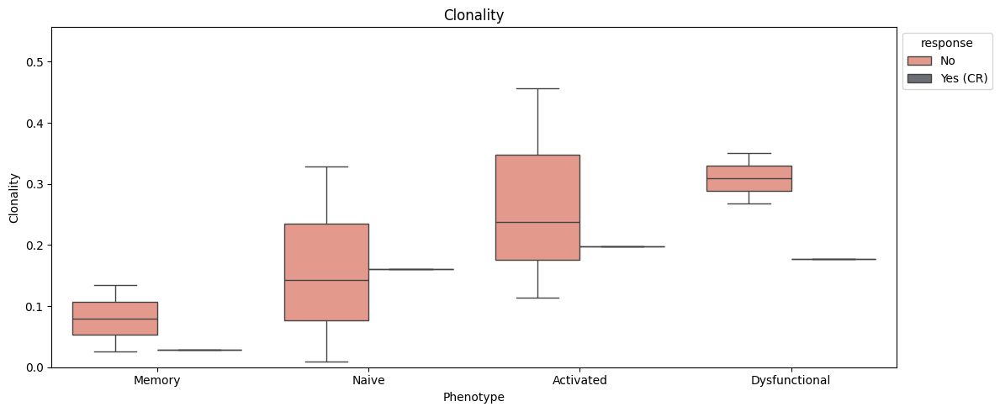

In [215]:
tcri.pl.clonality(adata,groupby="patient",splitby="response")